In [ ]:
import folium
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from folium.plugins import MarkerCluster


In [ ]:
# Assuming the data is in a CSV file named 'restaurant_data.csv'
df = pd.read_csv('Dataset .csv')
df.head(5)


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [ ]:
# Create a world map centered around a specific location (adjust coordinates as needed)
m = folium.Map(location=[20.5937, 78.9629], zoom_start=10)


In [ ]:
# Create a MarkerCluster to group markers for better visualization
marker_cluster = MarkerCluster().add_to(m)

# Iterate through the DataFrame and add markers to the cluster
for index, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']],
                  popup=row['Restaurant Name']).add_to(marker_cluster)

                  

In [21]:
m

In [22]:
# Count the number of restaurants in each city
city_counts = df['City'].value_counts()
print(city_counts.head(10))  # Print top 10 cities



New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: City, dtype: int64


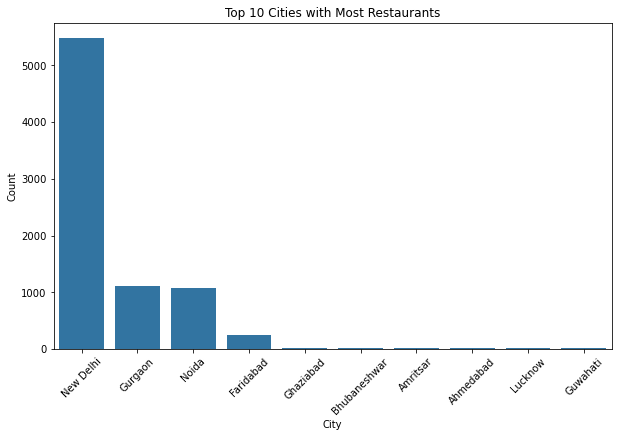

In [23]:
# Visualize the top 10 cities
plt.figure(figsize=(10, 6))
sns.barplot(x=city_counts.head(10).index, y=city_counts.head(10).values)
plt.title('Top 10 Cities with Most Restaurants')
plt.xlabel('City')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()



In [24]:
# Count the number of restaurants in each country (if applicable)
country_counts = df['Country Code'].value_counts()
print(country_counts)



1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: Country Code, dtype: int64


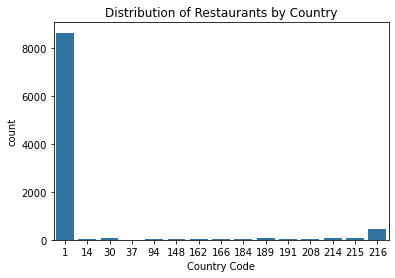

In [25]:
# Visualize the distribution of restaurants by country
sns.countplot(x='Country Code', data=df)
plt.title('Distribution of Restaurants by Country')
plt.show()

In [27]:
# Example using K-Means clustering:
from sklearn.cluster import KMeans

# Assuming you have latitude and longitude data
X = df[['Latitude', 'Longitude']]
kmeans = KMeans(n_clusters=5, random_state=0).fit(X)
df['Cluster'] = kmeans.labels_

# Calculate average rating for each cluster
cluster_ratings = df.groupby('Cluster')['Aggregate rating'].mean()
print(cluster_ratings)

Cluster
0    2.616041
1    4.000457
2    1.984603
3    4.107759
4    4.035938
Name: Aggregate rating, dtype: float64


In [28]:
# Calculate average rating for each city
city_ratings = df.groupby('City')['Aggregate rating'].mean()
print(city_ratings.head(10))

# Compare ratings between cities using statistical tests (e.g., ANOVA)

City
Abu Dhabi    4.300000
Agra         3.965000
Ahmedabad    4.161905
Albany       3.555000
Allahabad    3.395000
Amritsar     3.685714
Ankara       4.305000
Armidale     3.500000
Athens       4.200000
Auckland     4.275000
Name: Aggregate rating, dtype: float64
